# Driveline Biomechanics Hitter Analysis

## Author: Trey Chase

In [1]:
import pandas as pd
import numpy as np
from data_functions import load_poi_metrics, load_hittrax

# Load in Dataframes
poi_df = load_poi_metrics()
hittrax_df = load_hittrax()

In [2]:
# Join dataframe

raw_df = poi_df.merge(hittrax_df, on = 'session_swing', how = 'inner')

## Exploratory Data Analysis

In [3]:
# Show missingness
from data_functions import show_missingness

show_missingness(raw_df)

strike_zone              51
blast_bat_speed_mph_x    23
dtype: int64

Only two columns come out of the join with holes in them. `strike_zone` is blank on 51 pitches and
`blast_bat_speed_mph_x` on 23, out of 604 swings. The Blast gaps are the ones that cost us something,
since bat speed becomes the numerator of the swing efficiency variable further down. The strike zone
gaps cost us a labelling column that never gets used. Neither is worth imputing at this size, so the
rows just get dropped when the models are fit.

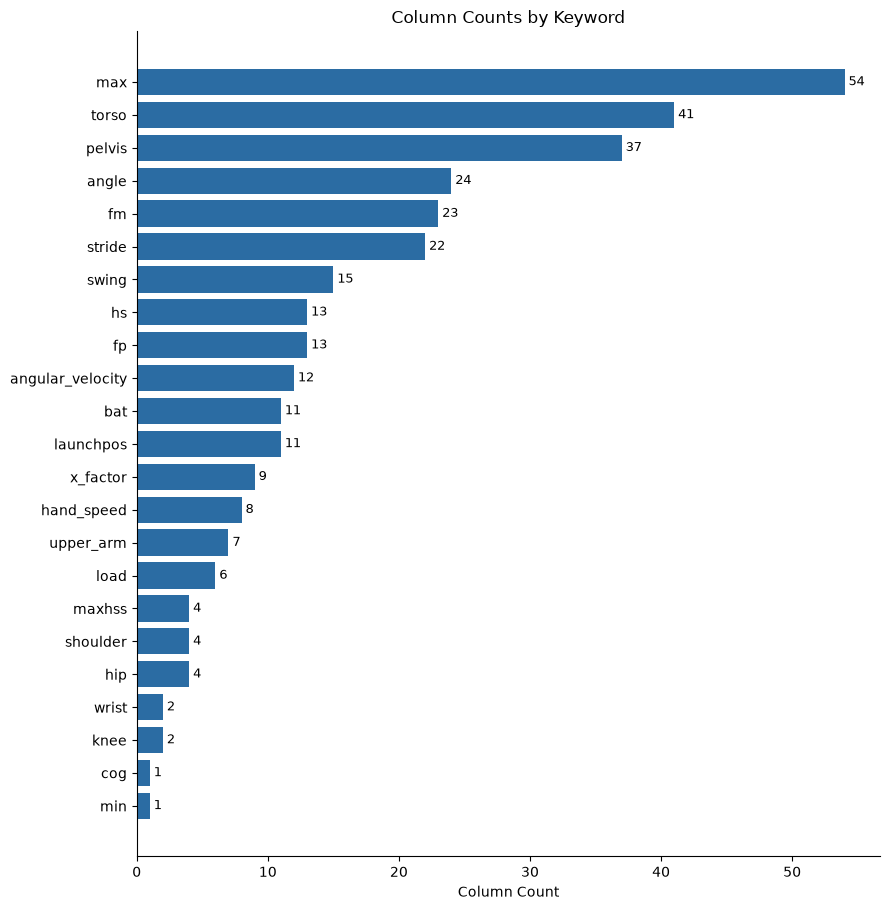

In [4]:
from data_functions import keyword_summary
from plot_functions import plot_keyword_summary

keywords = [
    "pelvis", "torso", "hip", "shoulder", "knee", "wrist", "bat", "hand_speed",
    "upper_arm", "x_factor", "cog",
    "fm", "fp", "hs", "load", "stride", "swing", "maxhss", "launchpos",
    "max", "min", "angular_velocity", "angle"
]

summary = keyword_summary(raw_df, keywords)
plot_keyword_summary(summary)

The column counts say a lot about what Driveline decided was worth measuring. Torso shows up in 41
columns and pelvis in 37, and once you set aside the aggregation words (`max` appears in 54 columns
simply because so many metrics are peaks), most of what is left describes rotation somewhere in the
trunk. Knee and wrist get two columns each.

So this is a dataset built around the kinematic sequence, meaning how the pelvis and torso turn and
in what order, rather than around what the hands and the barrel do in the last few frames. Any model
built on these columns inherits that emphasis.

In [5]:
from data_functions import create_keyword_dummies

dummy_df = create_keyword_dummies(raw_df)

dummy_df.head()

,session_swing,session,exit_velo_mph_x,blast_bat_speed_mph_x,bat_speed_mph_contact_x,sweet_spot_velo_mph_contact_x,sweet_spot_velo_mph_contact_y,sweet_spot_velo_mph_contact_z,bat_torso_angle_connection_x,attack_angle_contact_x,...,x_factor,cog,load,stride,swing,max,min,fm,fp,hs
0,103_1,103,97.2,66.8,67.9426,67.5411,1.1177,6.4040,121.0109,5.7984,...,1,1,1,1,1,1,1,1,1,1
1,103_2,103,88.8,65.0,66.0435,65.8729,-3.0676,0.6329,124.9791,0.2952,...,1,1,1,1,1,1,1,1,1,1
2,103_3,103,88.9,69.2,64.4315,63.6625,-2.7990,8.8720,122.6542,7.9991,...,1,1,1,1,1,1,1,1,1,1
3,103_4,103,83.1,58.5,60.6261,60.1218,-7.0960,0.0053,119.3526,-0.0462,...,1,1,1,1,1,1,1,1,1,1
4,103_5,103,91.6,68.2,65.2323,64.3499,-0.7677,10.0294,125.0015,8.7967,...,1,1,1,1,1,1,1,1,1,1


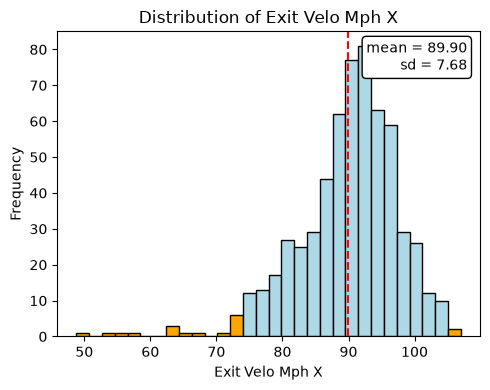

In [6]:
from plot_functions import plot_histogram

plot_histogram(dummy_df['exit_velo_mph_x'])

Exit velocity centers on 89.9 mph with a spread of 7.7, which is about right for a room full of
college hitters taking machine batting practice. The shape is lopsided. Roughly 3% of swings fall
more than two standard deviations below the mean and only 0.3% land that far above it, so nearly
every orange bar in the plot is on the left.

Those low outliers are mishits rather than bad hitters. The same swing that produces a 95 mph line
drive produces a 65 mph roller when it catches the ball half an inch low. That matters later, because
the model gets scored on those swings too.

In [7]:
from plot_functions import plot_correlation

plot_correlation(raw_df)

Across the 136 numeric columns the median absolute correlation is 0.09, and fewer than 5% of column
pairs clear 0.5. That wall of pale squares is the real finding here: no single joint angle carries
exit velocity on its own.

The relationships that do stand out are the ones closest to the ball. Bat speed at contact correlates
0.72 with exit velo and the Blast sensor's bat speed 0.59. After that it falls away quickly, with
hand speed at 0.29, torso angular velocity at 0.26 and pelvis angular velocity at 0.20. Pelvis and
torso peak velocity correlate 0.70 with each other, which is the sequence showing up in the data.

Worth noticing that the foot plant columns are far more redundant than the rest. Median absolute
correlation inside that block is 0.48, against 0.12 for the first move columns and 0.11 for heel
strike. At foot plant everyone is in more or less the same position, so those columns are largely
restating each other.

## Feature Engineering

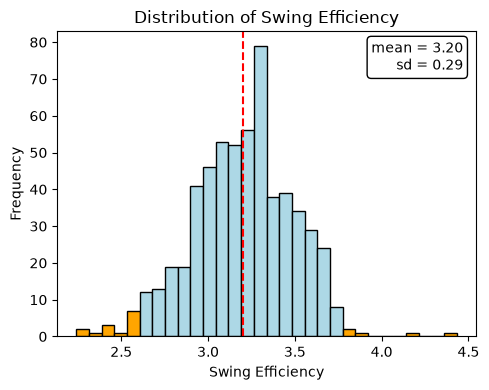

High swing efficiency - High bat speed relative to hand speed
Low swing efficiency - Low bat speed relative to hand speed, would advise mechanical adjustments


In [8]:
import numpy as np

# Create Swing Efficiency
raw_df['swing_efficiency'] = np.where(
    raw_df['hand_speed_blast_bat_mph_max_x'] == 0,
    np.nan,
    raw_df['blast_bat_speed_mph_x'] / raw_df['hand_speed_blast_bat_mph_max_x']
)

plot_histogram(raw_df["swing_efficiency"])
print(
    "High swing efficiency - High bat speed relative to hand speed\n"
    "Low swing efficiency - Low bat speed relative to hand speed, would advise mechanical adjustments"
)

Swing efficiency comes in at 3.20 on average, with 90% of swings between 2.70 and 3.64. The idea is
sound: it asks how much barrel speed a hitter converts out of the speed their hands are moving, which
is roughly a leverage question.

The caveat is in the arithmetic. The ratio correlates 0.51 with bat speed and -0.54 with hand speed,
so a hitter can score well here by swinging the barrel fast or by moving their hands slowly, and the
metric cannot tell those apart. The 4.4 at the right edge of the plot is more likely a low hand speed
reading than a hitter who has found double everyone else's leverage. Useful variable, but it needs to
be read next to the raw bat speed rather than on its own.

In [9]:
df = raw_df[['session_swing', 
             'pitch_angle', 
             # Biomech variables
             'bat_torso_angle_connection_x', 
             'hand_speed_mag_swing_max_velo_x',
             'swing_efficiency',
             'torso_angular_velocity_swing_max_x',
             'attack_angle_contact_x',
             # Location
             'poi_x',
             'poi_y',
             # Batted Ball Metrics
             'exit_velo_mph_x',
             'bearing',
             'la',
             'dist'
             ]]

In [10]:
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

target = "exit_velo_mph_x"
features = [c for c in df.columns if c not in ["exit_velo_mph_x", "bearing", "la", "dist", "session_swing"]]

model_df = df.dropna(subset=features + [target])
X = model_df[features]
y = model_df[target]

kf = KFold(n_splits=5, shuffle=True, random_state=42)

One thing to flag before anything gets fit. Bat speed is not in the feature list, even though it is
the strongest correlate of exit velocity in the entire dataset at 0.72. Leaving it out is defensible,
since predicting exit velo from bat speed is nearly circular and no coach can act on "swing faster",
but it does put a low ceiling on these models by construction. Swing efficiency smuggles part of it
back in through the numerator.

## XGBoost

In [11]:
xgb_param_grid = {
    "n_estimators": [100, 300],
    "max_depth": [3, 5, 7],
    "learning_rate": [0.01, 0.1],
}

xgb_grid = GridSearchCV(
    XGBRegressor(random_state=42),
    xgb_param_grid,
    cv=kf,
    scoring="neg_root_mean_squared_error",
    n_jobs=-1,
)
xgb_grid.fit(X, y)

xgb_rmse = -xgb_grid.best_score_
xgb_best_params = xgb_grid.best_params_

## Random Forest

In [12]:
rf_param_grid = {
    "n_estimators": [100, 300],
    "max_depth": [None, 5, 10],
    "min_samples_leaf": [1, 5],
}

rf_grid = GridSearchCV(
    RandomForestRegressor(random_state=42),
    rf_param_grid,
    cv=kf,
    scoring="neg_root_mean_squared_error",
    n_jobs=-1,
)
rf_grid.fit(X, y)

rf_rmse = -rf_grid.best_score_
rf_best_params = rf_grid.best_params_

## Model Comparison

In [13]:
results_df = pd.DataFrame([
    {"model": "XGBoost", "rmse": xgb_rmse, "best_params": xgb_best_params},
    {"model": "Random Forest", "rmse": rf_rmse, "best_params": rf_best_params},
])
results_df

,model,rmse,best_params
0,XGBoost,6.708819,"{'learning_rate': 0.01, 'max_depth': 5, 'n_est..."
1,Random Forest,6.561985,"{'max_depth': None, 'min_samples_leaf': 1, 'n_..."


Random Forest edges XGBoost, 6.56 against 6.71 RMSE, and the gap is small enough that I would not
read anything into which one won. The comparison that matters is against doing nothing. Exit velocity
has a standard deviation of 7.8 mph, so guessing the mean for every swing scores about 7.8. Both
models beat that by a little over a mile per hour, which works out to something near 29% of the
variance explained.

That is a real signal and a modest one, and it is roughly what you would expect. The pitch is a
machine fastball, so there is no pitch quality to model, and the largest single driver of exit
velocity is where on the barrel the ball hits. That is not in the data at all. `poi_x` and `poi_y`
locate contact in the strike zone, not on the bat.

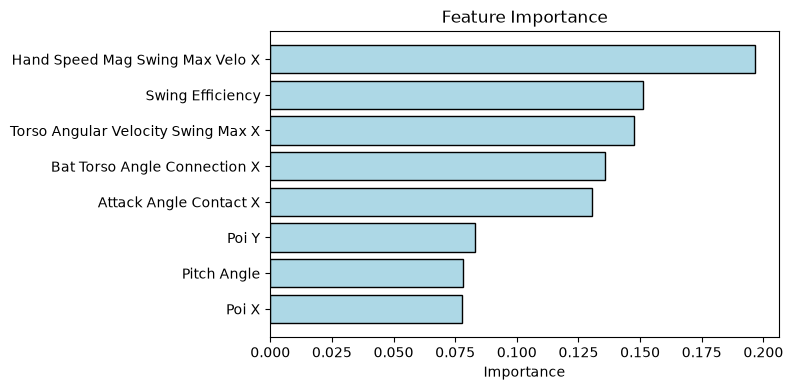

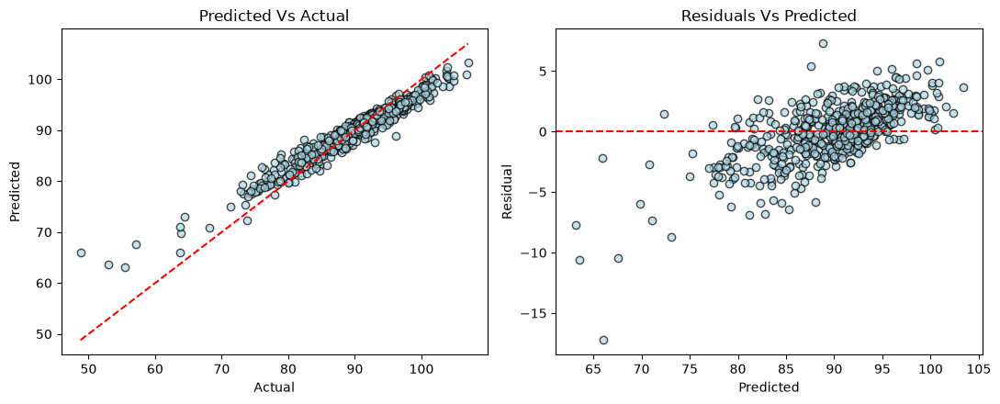

Train RMSE: 2.41
CV RMSE: 6.56


In [14]:
from plot_functions import plot_feature_importance, plot_regression_diagnostics
from sklearn.metrics import mean_squared_error

rf_best = rf_grid.best_estimator_

plot_feature_importance(rf_best, X.columns)
plot_regression_diagnostics(rf_best, X, y)

train_rmse = np.sqrt(mean_squared_error(y, rf_best.predict(X)))
print(f"Train RMSE: {train_rmse:.2f}")
print(f"CV RMSE: {rf_rmse:.2f}")

Hand speed comes out on top, with swing efficiency and torso angular velocity just behind. The five
biomechanical variables are bunched between 0.13 and 0.20, tight enough that I would treat the order
as suggestive rather than settled. Refit with a different seed and the middle three would probably
trade places. Swing efficiency ranking second is also a little suspicious given it correlates only
0.12 with exit velocity by itself; the forest is likely using it as a proxy for bat speed, which is
exactly what its numerator is.

The diagnostics are the more useful half of this cell. A train RMSE of 2.41 against a cross validated
6.56 is what an unpruned forest always looks like, and the winning parameters say as much: no depth
limit and one sample per leaf, so the trees memorize the training set. More interesting is the shape
of the errors. The model only ever predicts between 63 and 103 mph while the actual swings run from
49 to 107, and the residual panel slopes upward from left to right. The hardest hit balls come in
about 3 mph under-predicted and the weakest about 4 mph over.

That is regression to the mean, and it is the honest behavior of a model that does not have the
information it would need to call a 105 mph barrel in advance. It can find the hitters who move fast
and rotate hard. It cannot tell you which of their swings squares the ball up.

## Watching the Swings

Everything above is a point-of-interest table, one row per swing, every column already reduced to a
single number. The C3D files behind that table are still available and they hold the whole swing at
360 Hz: 55 markers on the hitter and the bat, plus four force plates under the batter's box sampled
at 1080 Hz.

Driveline does not keep those files in the git repo, they ship as an asset on the `dataset-v1`
release, so the first cell pulls them down (about 400 MB, 687 swings from 97 hitters) and unzips them
into `data/c3d`. It skips the download if the files are already there.

In [ ]:
from c3d_functions import download_c3d, index_swings

c3d_dir = download_c3d()
swing_index = index_swings(c3d_dir)

swing_index[["user", "session", "side", "exit_velo_mph", "session_swing",
             "highest_playing_level", "bat_length_in"]].head()

The filenames carry the hitter, the session, height, weight, hitting side, swing number and exit
velocity, which is enough to work with on its own. `index_swings` also recovers the `session_swing`
key by lining up exit velocities within each session, so 660 of the 687 C3D swings can be joined back
to the POI table used earlier. The other 27 are swings Driveline captured but never published metrics
for.

`save_dashboard` writes the standalone HTML, which opens in any browser on its own. `dashboard.show()`
is the extra step that draws it inline here, and plotly needs `nbformat` installed to do that. Without
it the file is still written and only the inline render raises. It also embeds a couple of megabytes of
figure data in this notebook every time it runs, so opening the saved file instead is the lighter
option.

In [ ]:
from sklearn.model_selection import cross_val_predict

from dashboard import pick_showcase, prepare_swings, swing_dashboard, save_dashboard

# Out-of-fold predictions, so the panel shows what the forest does on swings it
# has not seen. Its in-sample fit would flatter it by about 4 mph of RMSE.
predictions = pd.DataFrame({
    "session_swing": model_df["session_swing"].values,
    "actual": y.values,
    "predicted": cross_val_predict(rf_best, X, y, cv=kf),
})

showcase = pick_showcase(swing_index, n=8, restrict_to=predictions["session_swing"])
swings = prepare_swings(showcase)

fig = swing_dashboard(swings, predictions=predictions)
print("written to", save_dashboard(fig, "dashboards/hitter_swing_dashboard.html"))

# Needs nbformat installed. If it comes up blank the notebook renderer is
# struggling with a figure this size, so open the saved file above instead, or
# push it to a real browser with:
#     import plotly.io as pio; pio.renderers.default = "browser"
fig.show()

Pick a hitter from the dropdown and hit play. The skeleton and bat animate through the swing, the red
tail is where the sweet spot has been over the last fifth of a second, and the panel on the right
tracks bat speed against the vertical force each leg is putting into the ground. Every swing is
resampled onto the same clock with zero at contact, so switching hitters lines up like for like.

Contact is taken as the frame of peak sweet spot speed, which is not a labelled event in these files
but lands within a frame or two of the real thing. As a check, peak speed measured this way
correlates 0.96 with Driveline's own `bat_speed_mph_max_x` with a median error of about 1 mph.

The bottom right panel puts the swing back next to the model. Every dot is one of the 581 modelled
swings, plotted as the forest's out-of-fold guess against what the ball actually did, and the orange
dot is whichever swing is loaded. The cloud is visibly flatter than the parity line, which is the
residual plot from earlier seen from a different angle: the model pulls everything toward 90 mph. The
hardest swing in the showcase left the bat at 107 and got called at 94.

What the force traces show is the part the POI table cannot. The rear leg carries the hitter through
the load and then unloads, the lead leg spikes somewhere between 140 and 290% of bodyweight in the
150 ms before contact, and bat speed only climbs after that front foot is down and braced. The
hitters getting the largest lead leg spikes are broadly the ones with the higher exit velocities,
which is the same story the torso and pelvis velocity columns were telling upstairs, just visible as
it happens rather than collapsed into a peak value.

Twelve of the 687 trials lose the bat markers badly enough to reconstruct a barrel travelling at
several hundred mph. `prepare_swings` checks for that and skips them with a warning rather than
animating nonsense. `restrict_to` narrows the showcase further, to the swings the model could
actually score: a swing with no Blast bat speed reading has no swing efficiency, so it never made it
into the training set.

Any of the 687 swings, rather than just the eight loaded here, is reachable through the Streamlit
front end: `streamlit run streamlit_app.py`. It renders the same three panels with the hitter chosen
in the sidebar, which also sidesteps a notebook renderer that struggles with a figure this size.